In [9]:
import numpy as np
import time
import os
import joblib
import matplotlib.pyplot as plt

import datetime as dt
import tensorflow as tf

from tensorflow.keras.datasets import mnist, cifar10, fashion_mnist
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Activation, Dropout, Flatten,Reshape, LeakyReLU, BatchNormalization, UpSampling2D, Conv2D, Embedding, Concatenate, Multiply, Conv2DTranspose
from tensorflow.keras.optimizers import Adam

devices = tf.config.list_physical_devices('GPU')
tf.config.list_physical_devices('GPU')
tf.config.set_visible_devices(devices[0], 'GPU')

def bulid_generator(latent_dim, img_shape):

    noise = Input(shape=(latent_dim,))

    size = img_shape[0] // 4

    # 入力ノイズ: 100 --> FC 層の出力:(128*8*8) --> 
    #リシェイプ:(8, 8, 128) --> アップサンプリング:(16, 16, 64)
    hid = Dense(128 * size * size, activation="relu")(noise)
    hid = Reshape((size, size, 128))(hid)
    hid = UpSampling2D()(hid)
    
    # 入力:(16, 16, 128) --> 出力:(32, 32, 128)
    hid = Conv2D(128, kernel_size=3, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = Activation("relu")(hid)
    hid = UpSampling2D()(hid)

    # 入力:(32, 32, 128) --> 出力:(32, 32, 64)
    hid = Conv2D(64, kernel_size=3, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = Activation("relu")(hid)

    # 入力:(32, 32, 64) --> 出力:(32, 32, 3)
    hid = Conv2D(img_shape[2], kernel_size=3, padding="same")(hid)
    img = Activation("tanh")(hid)

    return Model(noise, img)

def build_discriminator(img_shape):
    img = Input(shape=img_shape)
    
# 入力:(32, 32, 3) --> 出力:(16, 16, 32)
    hid = Conv2D(32, kernel_size=3, strides=2, padding="same")(img)
    hid = LeakyReLU(alpha=0.2)(hid)

# 入力:(16, 16, 32) --> 出力:(8, 8, 64)
    hid = Conv2D(64, kernel_size=3, strides=2, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = LeakyReLU(alpha=0.2)(hid)

# 入力:(8, 8, 64) --> 出力:(4, 4, 128)
    hid = Conv2D(128, kernel_size=3, strides=2, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = LeakyReLU(alpha=0.2)(hid)

# 入力:(4, 4, 128) --> Conv 出力:(4, 4, 256) --> falatten:(4096(4*4*256))
    hid = Conv2D(256, kernel_size=3, strides=2, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = LeakyReLU(alpha=0.2)(hid)
    hid = Flatten()(hid)

# 入力:(4106) --> 出力:(1) 真偽の判定結果
    hid = Dense(512, activation="relu")(hid)
    validity = Dense(1, activation="sigmoid")(hid)

    return Model(img, validity)

def train(train_data):
    # Rescale -1 to 1
    # 画像の輝度値を 0 -- 255 から -1 -- 1 にリサイズ
    train_data = train_data.astype(np.float32) / 127.5 - 1.0
    print(train_data.shape)

    generator = bulid_generator(latent_dim, train_data.shape[1:])
    discriminator = build_discriminator(train_data.shape[1:])

    optimizer = Adam(0.0001, 0.5)

    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

    # The generator takes noise as input and generates imgs
    # G は入力としてノイズを受け取り画像を生成
    z = Input(shape=(latent_dim,))
    img = generator(z)

    # For the combined model we will only train the generator
    # コンバインドモデルは G のみ訓練するため、D の重みを固定
    discriminator.trainable = False

    # The discriminator takes generated images as input and determines validity
    # D は入力として生成画像を受け取り、真偽を判定
    valid = discriminator(img)

    # The combined model  (stacked generator and discriminator)
    # Trains the generator to fool the discriminator
    # G は D を騙すように訓練される
    combined = Model(z, valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    iterations = train_data.shape[0] / batch_size
    print('iterations:', iterations)
    
    # 　画像の真偽ラベルを用意
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))
    
    for epoch in range(epochs):
        for i in range(int(iterations)-1):

            # ---------------------
            #  Train Discriminator
            # ---------------------
                
            s = int(epoch * iterations) + i
            np.random.seed(s)
            idx = np.random.randint(0, train_data.shape[0], batch_size)

            # Select a random half of images
            # 訓練で使用する real 画像とその画像のクラスラベルをランダムに選び出す
            imgs = train_data[idx]

            # Sample noise and generate a batch of new images
            # サンプルノイズを用意してから、そのノイズとクラスラベルを元に G で fake 画像を生成
            np.random.seed(s)
            noise = np.random.normal(0, 1, (batch_size, latent_dim))

            gen_imgs = generator.predict(noise)
            
            d_imgs = np.concatenate([imgs, gen_imgs])
            np.random.seed(s)
            np.random.shuffle(d_imgs)

            d_y = np.concatenate([real, fake])
            np.random.seed(s)
            np.random.shuffle(d_y)

            # Train the discriminator (real classified as ones and generated as zeros)
            # D を訓練（real 画像のラベルを 1、fake 画像のラベルは 0）
            d_loss = discriminator.train_on_batch(d_imgs, d_y)

            # ---------------------
            #  Train Generator
            # ---------------------
            
            
            # Train the generator (wants discriminator to mistake images as real)
            # G を訓練（D が G の生成画像を誤って real 1 と判定するように訓練される）
            g_loss = combined.train_on_batch(noise, real)

            # If at save interval => save generated image samples
            # 生成画像を保存
            if i % 500 == 0:
                print(d_loss, g_loss)
            
                # Plot the progress
                # 訓練の途中経過を出力
                print("{}:{} [D loss: {}] [G loss: {}]".format(epoch, i, d_loss[0], g_loss))

                size = 4
                noise = np.random.normal(0, 1, (size * size, latent_dim))

                gen_imgs = generator.predict(noise)

                combine_images(log_path, gen_imgs, epoch, i, iterations, size)

def combine_images(log_path, gen_imgs, epoch, idx, iterations, size):
    r, c = size, size
    
    # 生成画像を0-1に再スケール
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            img = gen_imgs[cnt, :, :, :]
            axs[i, j].imshow(img, cmap='gray' if img.shape[2] == 1 else 'viridis')
            axs[i, j].axis('off')
            cnt += 1
    fig.savefig("{}/{}.png".format(log_path, epoch))
    plt.show()
    plt.close()

In [3]:
import gc
gc.collect()

44

In [5]:
train_data = joblib.load('D:/Works/Programs/gan/data/ffhq-dataset-images/numpy/thumbnails32x32.joblib')
train_data.shape

(70000, 32, 32, 3)

(70000, 32, 32, 3)
iterations: 70.0
[1.02638840675354, 0.4320000112056732] 0.703145444393158
0:0 [D loss: 1.02638840675354] [G loss: 0.703145444393158]


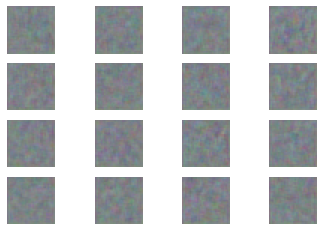

[0.17695894837379456, 0.9399999976158142] 1.2498623132705688
1:0 [D loss: 0.17695894837379456] [G loss: 1.2498623132705688]


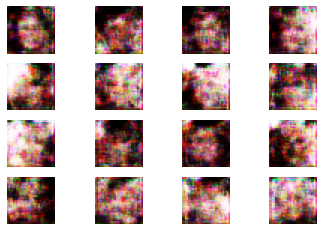

[0.2579394578933716, 0.9164999723434448] 6.681609153747559
2:0 [D loss: 0.2579394578933716] [G loss: 6.681609153747559]


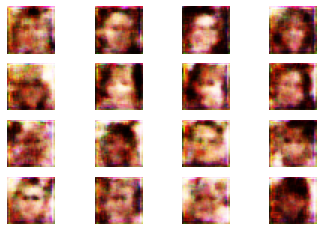

[0.0636381059885025, 0.9850000143051147] 0.30784234404563904
3:0 [D loss: 0.0636381059885025] [G loss: 0.30784234404563904]


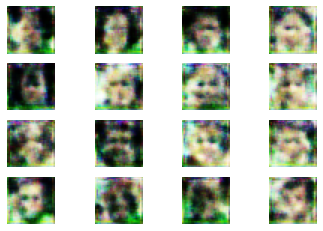

[0.020639587193727493, 0.9950000047683716] 5.705195426940918
4:0 [D loss: 0.020639587193727493] [G loss: 5.705195426940918]


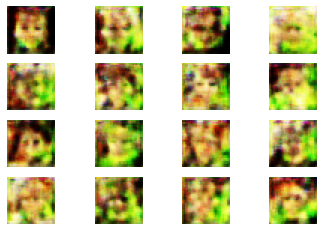

[0.21507838368415833, 0.9164999723434448] 4.321723461151123
5:0 [D loss: 0.21507838368415833] [G loss: 4.321723461151123]


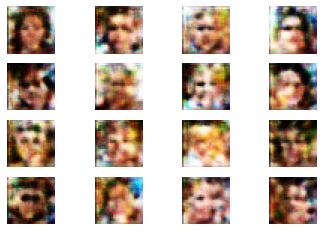

[0.009085247293114662, 0.9984999895095825] 5.145094871520996
6:0 [D loss: 0.009085247293114662] [G loss: 5.145094871520996]


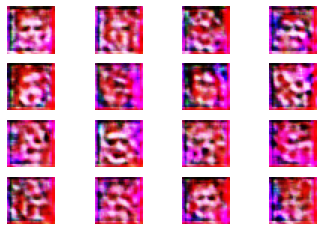

[0.1338372826576233, 0.953000009059906] 2.0928940773010254
7:0 [D loss: 0.1338372826576233] [G loss: 2.0928940773010254]


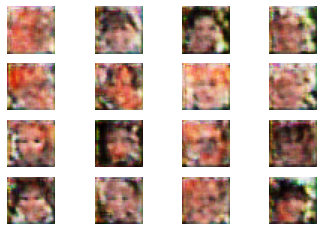

[0.10396631807088852, 0.968500018119812] 0.7596198916435242
8:0 [D loss: 0.10396631807088852] [G loss: 0.7596198916435242]


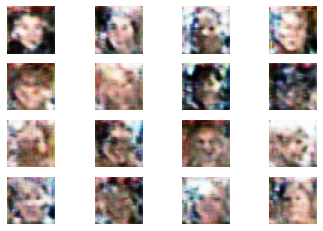

[0.18261797726154327, 0.9290000200271606] 4.454432487487793
9:0 [D loss: 0.18261797726154327] [G loss: 4.454432487487793]


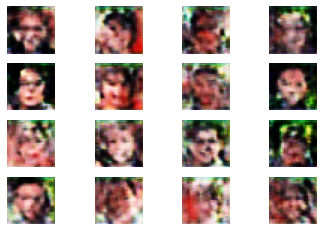

[0.3022015392780304, 0.8734999895095825] 1.9669197797775269
10:0 [D loss: 0.3022015392780304] [G loss: 1.9669197797775269]


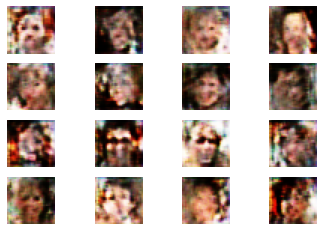

[0.31074827909469604, 0.8744999766349792] 2.567091464996338
11:0 [D loss: 0.31074827909469604] [G loss: 2.567091464996338]


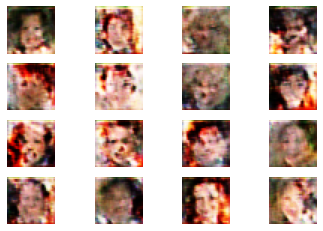

[0.2332131266593933, 0.9144999980926514] 1.9205656051635742
12:0 [D loss: 0.2332131266593933] [G loss: 1.9205656051635742]


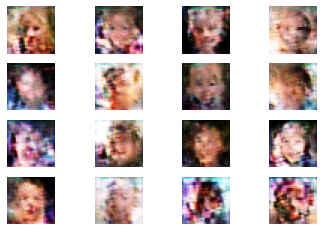

[0.2288944572210312, 0.9185000061988831] 1.9688884019851685
13:0 [D loss: 0.2288944572210312] [G loss: 1.9688884019851685]


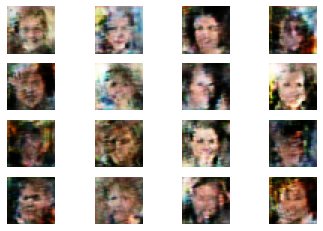

[0.3357387185096741, 0.859000027179718] 1.2151039838790894
14:0 [D loss: 0.3357387185096741] [G loss: 1.2151039838790894]


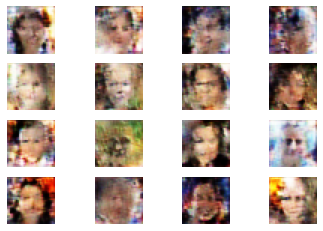

[0.29304587841033936, 0.8715000152587891] 2.394925117492676
15:0 [D loss: 0.29304587841033936] [G loss: 2.394925117492676]


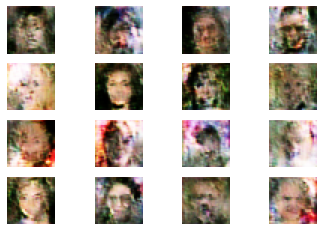

[0.36149224638938904, 0.8424999713897705] 1.5505846738815308
16:0 [D loss: 0.36149224638938904] [G loss: 1.5505846738815308]


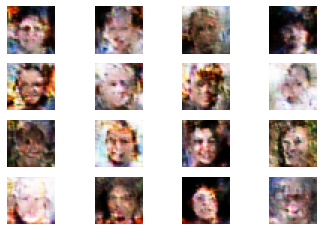

[0.3704160749912262, 0.8414999842643738] 1.9623843431472778
17:0 [D loss: 0.3704160749912262] [G loss: 1.9623843431472778]


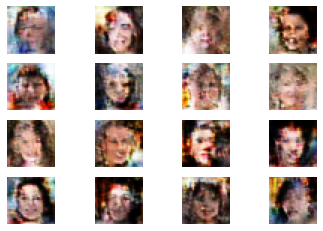

[0.35350117087364197, 0.8454999923706055] 2.552203416824341
18:0 [D loss: 0.35350117087364197] [G loss: 2.552203416824341]


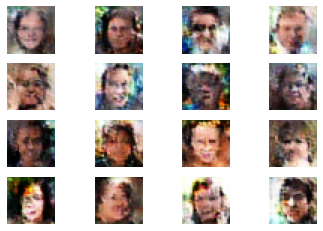

[0.36345189809799194, 0.8389999866485596] 2.1927406787872314
19:0 [D loss: 0.36345189809799194] [G loss: 2.1927406787872314]


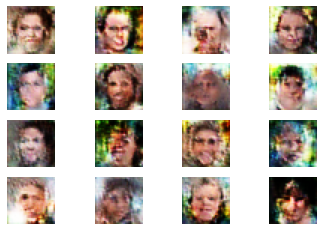

[0.40646156668663025, 0.8180000185966492] 1.7732330560684204
20:0 [D loss: 0.40646156668663025] [G loss: 1.7732330560684204]


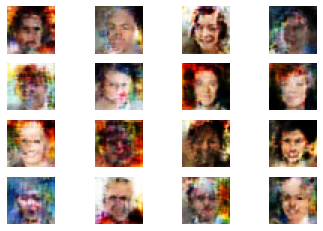

[0.40708252787590027, 0.8180000185966492] 1.8206992149353027
21:0 [D loss: 0.40708252787590027] [G loss: 1.8206992149353027]


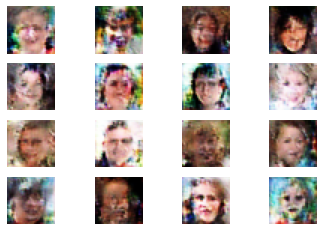

[0.36134055256843567, 0.8370000123977661] 1.910139560699463
22:0 [D loss: 0.36134055256843567] [G loss: 1.910139560699463]


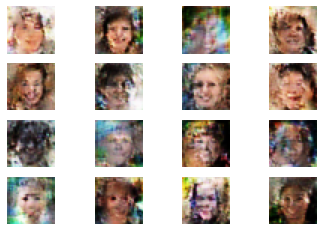

[0.3677825331687927, 0.8379999995231628] 1.5858683586120605
23:0 [D loss: 0.3677825331687927] [G loss: 1.5858683586120605]


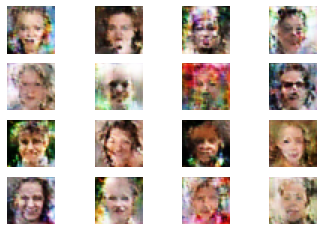

[0.3704048693180084, 0.8335000276565552] 1.7845832109451294
24:0 [D loss: 0.3704048693180084] [G loss: 1.7845832109451294]


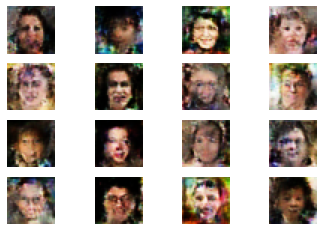

[0.37206703424453735, 0.8420000076293945] 1.527748942375183
25:0 [D loss: 0.37206703424453735] [G loss: 1.527748942375183]


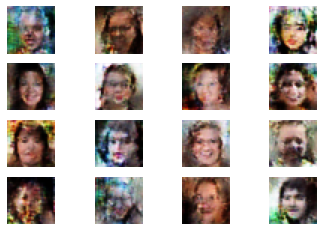

[0.3527263402938843, 0.8644999861717224] 1.6770747900009155
26:0 [D loss: 0.3527263402938843] [G loss: 1.6770747900009155]


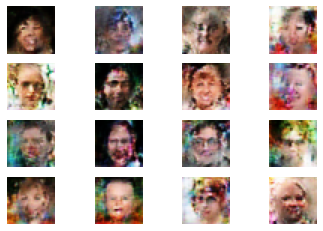

[0.34760531783103943, 0.8654999732971191] 2.03064227104187
27:0 [D loss: 0.34760531783103943] [G loss: 2.03064227104187]


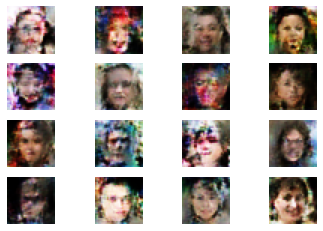

[0.38681840896606445, 0.8240000009536743] 1.7981746196746826
28:0 [D loss: 0.38681840896606445] [G loss: 1.7981746196746826]


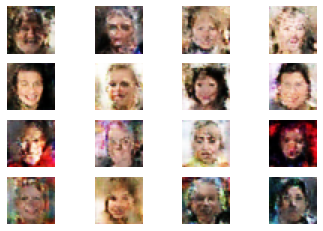

[0.3851299583911896, 0.8330000042915344] 1.9770762920379639
29:0 [D loss: 0.3851299583911896] [G loss: 1.9770762920379639]


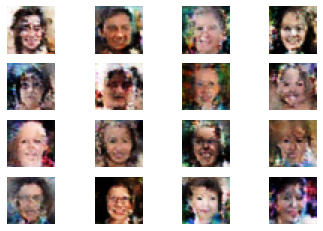

[0.3695272207260132, 0.8395000100135803] 1.2483445405960083
30:0 [D loss: 0.3695272207260132] [G loss: 1.2483445405960083]


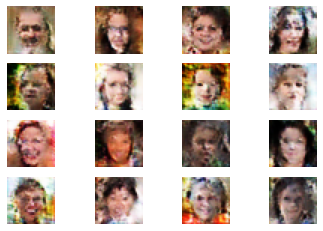

[0.4237086772918701, 0.8009999990463257] 1.3260055780410767
31:0 [D loss: 0.4237086772918701] [G loss: 1.3260055780410767]


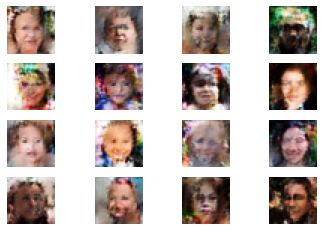

[0.37099239230155945, 0.8190000057220459] 2.03212308883667
32:0 [D loss: 0.37099239230155945] [G loss: 2.03212308883667]


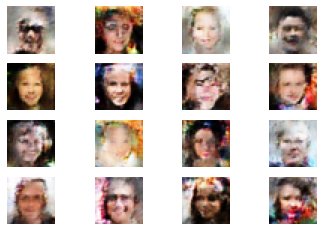

[0.38310733437538147, 0.8234999775886536] 1.843502163887024
33:0 [D loss: 0.38310733437538147] [G loss: 1.843502163887024]


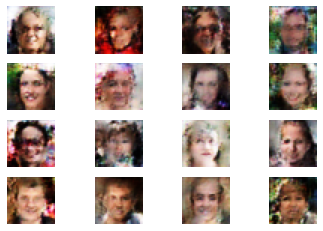

[0.3596739172935486, 0.8414999842643738] 1.7706172466278076
34:0 [D loss: 0.3596739172935486] [G loss: 1.7706172466278076]


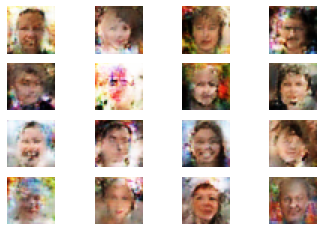

[0.3572002649307251, 0.8355000019073486] 1.7107138633728027
35:0 [D loss: 0.3572002649307251] [G loss: 1.7107138633728027]


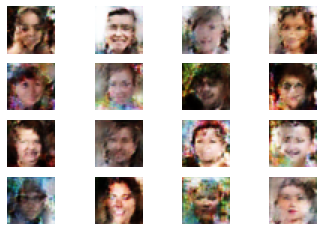

[0.38897454738616943, 0.8209999799728394] 1.9278827905654907
36:0 [D loss: 0.38897454738616943] [G loss: 1.9278827905654907]


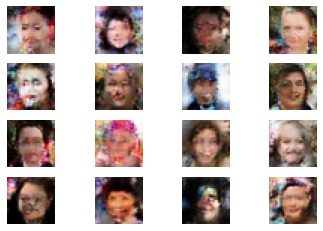

[0.37617596983909607, 0.8299999833106995] 1.8256537914276123
37:0 [D loss: 0.37617596983909607] [G loss: 1.8256537914276123]


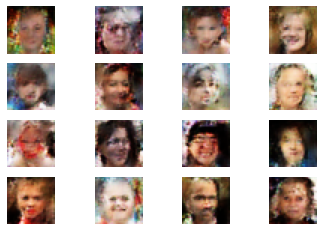

[0.3609412908554077, 0.8504999876022339] 2.001920461654663
38:0 [D loss: 0.3609412908554077] [G loss: 2.001920461654663]


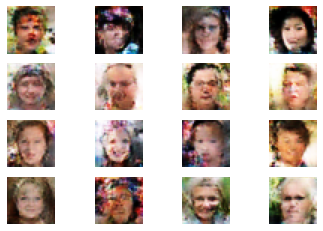

[0.35756614804267883, 0.8495000004768372] 1.9635318517684937
39:0 [D loss: 0.35756614804267883] [G loss: 1.9635318517684937]


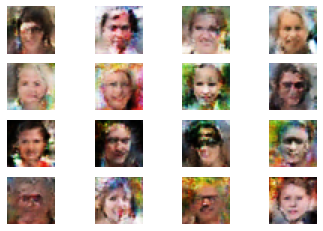

[0.39733055233955383, 0.8090000152587891] 1.4071595668792725
40:0 [D loss: 0.39733055233955383] [G loss: 1.4071595668792725]


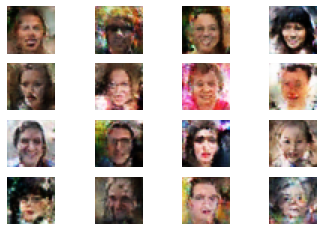

[0.3806822597980499, 0.8324999809265137] 1.5845766067504883
41:0 [D loss: 0.3806822597980499] [G loss: 1.5845766067504883]


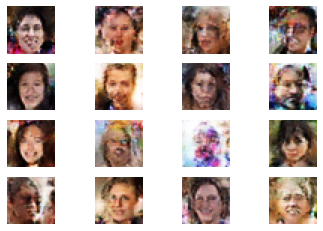

[0.3642336130142212, 0.847000002861023] 1.509551763534546
42:0 [D loss: 0.3642336130142212] [G loss: 1.509551763534546]


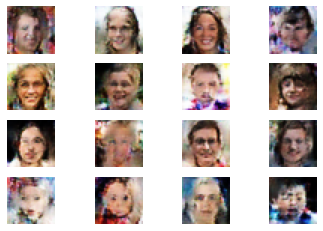

[0.40080127120018005, 0.8209999799728394] 1.477915644645691
43:0 [D loss: 0.40080127120018005] [G loss: 1.477915644645691]


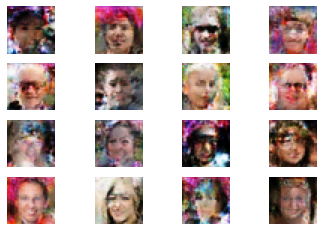

[0.38457009196281433, 0.8324999809265137] 1.7037420272827148
44:0 [D loss: 0.38457009196281433] [G loss: 1.7037420272827148]


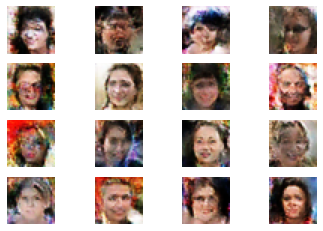

[0.3801729083061218, 0.8355000019073486] 1.510372281074524
45:0 [D loss: 0.3801729083061218] [G loss: 1.510372281074524]


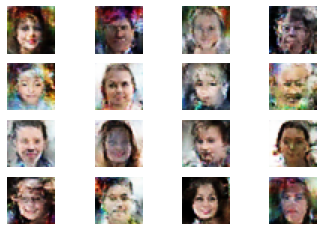

[0.3956526815891266, 0.8159999847412109] 1.607298493385315
46:0 [D loss: 0.3956526815891266] [G loss: 1.607298493385315]


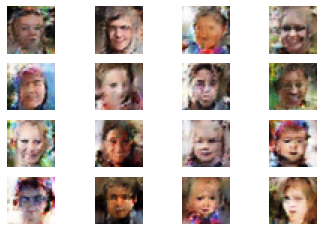

[0.3794388771057129, 0.8330000042915344] 1.5943317413330078
47:0 [D loss: 0.3794388771057129] [G loss: 1.5943317413330078]


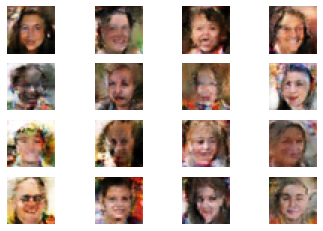

[0.4046174883842468, 0.815500020980835] 1.6475021839141846
48:0 [D loss: 0.4046174883842468] [G loss: 1.6475021839141846]


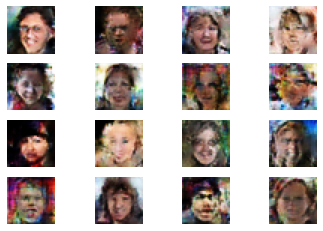

[0.31942489743232727, 0.8644999861717224] 1.716369867324829
49:0 [D loss: 0.31942489743232727] [G loss: 1.716369867324829]


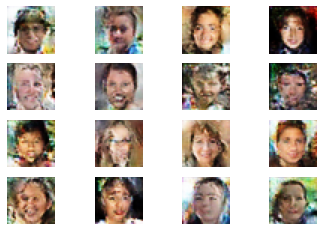

[0.3939773440361023, 0.8264999985694885] 0.7723032236099243
50:0 [D loss: 0.3939773440361023] [G loss: 0.7723032236099243]


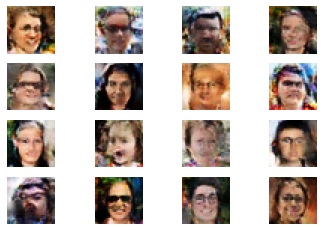

[0.4011545181274414, 0.815500020980835] 1.4298341274261475
51:0 [D loss: 0.4011545181274414] [G loss: 1.4298341274261475]


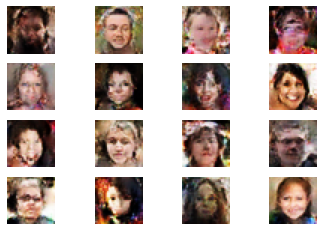

[0.39211493730545044, 0.8240000009536743] 1.1980563402175903
52:0 [D loss: 0.39211493730545044] [G loss: 1.1980563402175903]


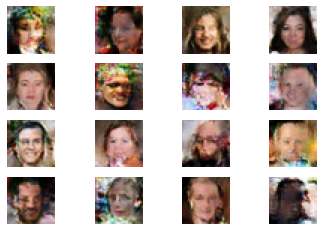

[0.4014941453933716, 0.824999988079071] 1.5012255907058716
53:0 [D loss: 0.4014941453933716] [G loss: 1.5012255907058716]


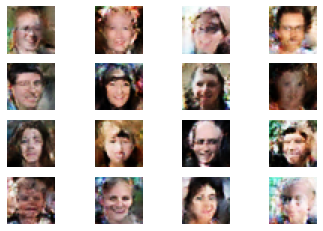

[0.3475953936576843, 0.8539999723434448] 1.8312065601348877
54:0 [D loss: 0.3475953936576843] [G loss: 1.8312065601348877]


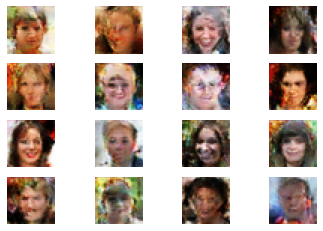

[0.3755776882171631, 0.8289999961853027] 1.7067362070083618
55:0 [D loss: 0.3755776882171631] [G loss: 1.7067362070083618]


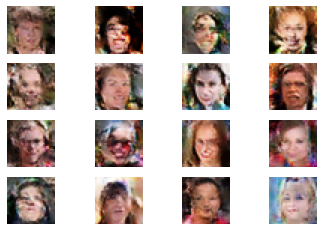

[0.3856412470340729, 0.8245000243186951] 1.4208720922470093
56:0 [D loss: 0.3856412470340729] [G loss: 1.4208720922470093]


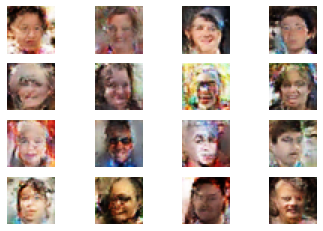

[0.35950398445129395, 0.8464999794960022] 1.768438696861267
57:0 [D loss: 0.35950398445129395] [G loss: 1.768438696861267]


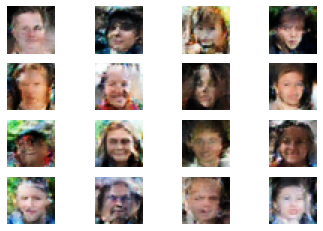

[0.3439796268939972, 0.8544999957084656] 1.7627264261245728
58:0 [D loss: 0.3439796268939972] [G loss: 1.7627264261245728]


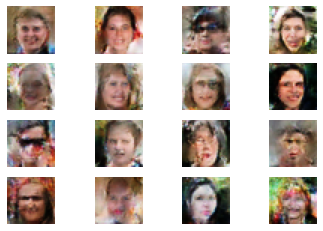

[0.34692469239234924, 0.8519999980926514] 1.6727983951568604
59:0 [D loss: 0.34692469239234924] [G loss: 1.6727983951568604]


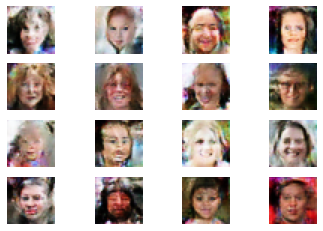

[0.4134249687194824, 0.7994999885559082] 1.2597848176956177
60:0 [D loss: 0.4134249687194824] [G loss: 1.2597848176956177]


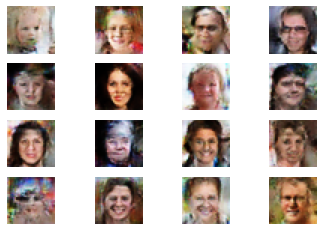

[0.3698546886444092, 0.8259999752044678] 1.2478363513946533
61:0 [D loss: 0.3698546886444092] [G loss: 1.2478363513946533]


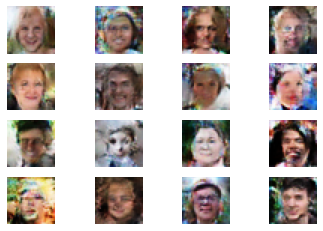

[0.3128187954425812, 0.8665000200271606] 1.3640204668045044
62:0 [D loss: 0.3128187954425812] [G loss: 1.3640204668045044]


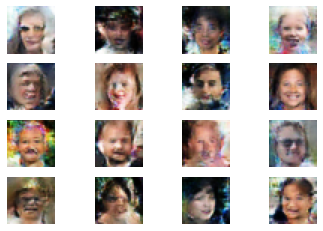

[0.3892022669315338, 0.8320000171661377] 1.5053499937057495
63:0 [D loss: 0.3892022669315338] [G loss: 1.5053499937057495]


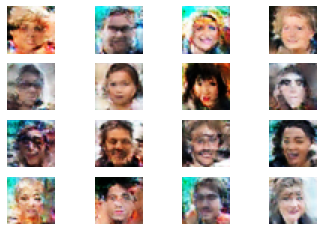

[0.3839101493358612, 0.809499979019165] 1.9520726203918457
64:0 [D loss: 0.3839101493358612] [G loss: 1.9520726203918457]


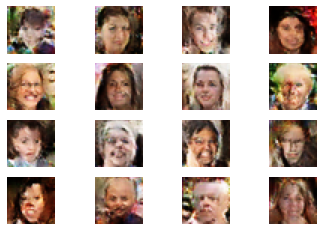

[0.3828369677066803, 0.8305000066757202] 1.4657992124557495
65:0 [D loss: 0.3828369677066803] [G loss: 1.4657992124557495]


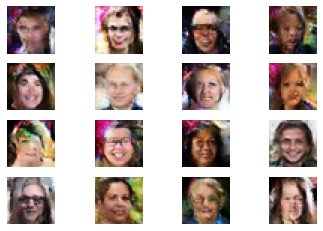

[0.3673548996448517, 0.8370000123977661] 1.5474773645401
66:0 [D loss: 0.3673548996448517] [G loss: 1.5474773645401]


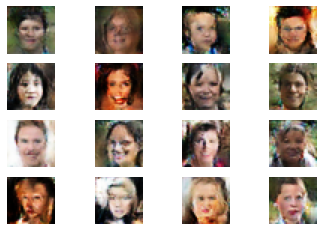

[0.37086474895477295, 0.8395000100135803] 1.200449824333191
67:0 [D loss: 0.37086474895477295] [G loss: 1.200449824333191]


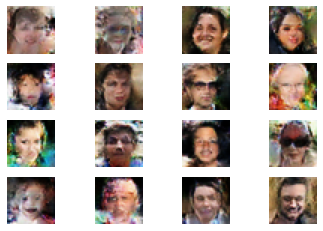

[0.39442768692970276, 0.8115000128746033] 1.8994591236114502
68:0 [D loss: 0.39442768692970276] [G loss: 1.8994591236114502]


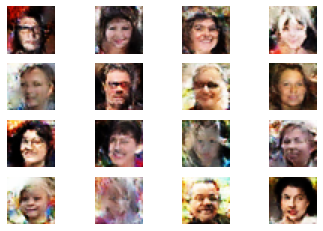

[0.3952416479587555, 0.8144999742507935] 1.55330491065979
69:0 [D loss: 0.3952416479587555] [G loss: 1.55330491065979]


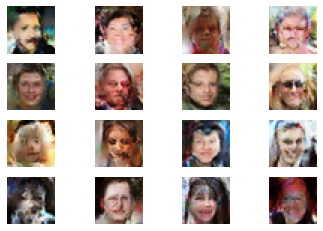

[0.3573136627674103, 0.8475000262260437] 1.9743387699127197
70:0 [D loss: 0.3573136627674103] [G loss: 1.9743387699127197]


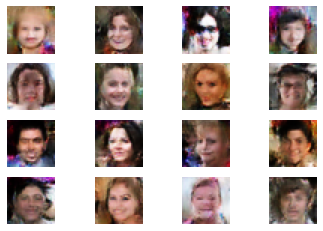

[0.3403809368610382, 0.8539999723434448] 1.7242581844329834
71:0 [D loss: 0.3403809368610382] [G loss: 1.7242581844329834]


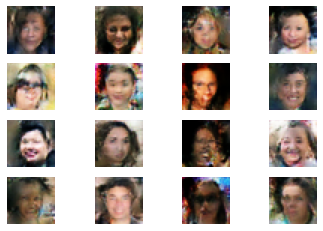

[0.382274866104126, 0.8305000066757202] 1.3372091054916382
72:0 [D loss: 0.382274866104126] [G loss: 1.3372091054916382]


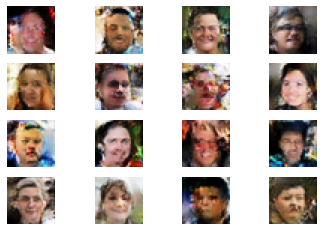

[0.375230610370636, 0.8199999928474426] 2.0613386631011963
73:0 [D loss: 0.375230610370636] [G loss: 2.0613386631011963]


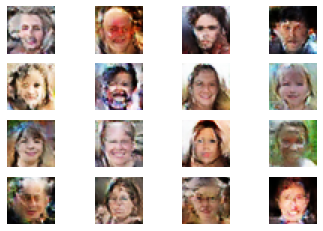

[0.3702535331249237, 0.8345000147819519] 1.9940197467803955
74:0 [D loss: 0.3702535331249237] [G loss: 1.9940197467803955]


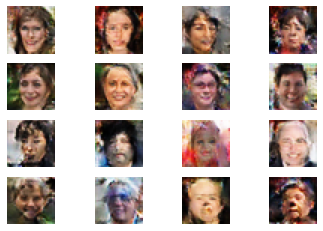

[0.3762308359146118, 0.8295000195503235] 1.715450644493103
75:0 [D loss: 0.3762308359146118] [G loss: 1.715450644493103]


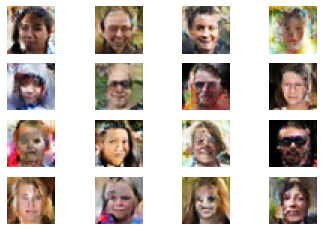

[0.34121063351631165, 0.8565000295639038] 1.611181378364563
76:0 [D loss: 0.34121063351631165] [G loss: 1.611181378364563]


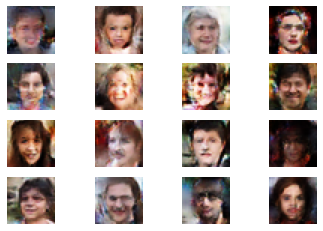

[0.31669846177101135, 0.8679999709129333] 1.812658667564392
77:0 [D loss: 0.31669846177101135] [G loss: 1.812658667564392]


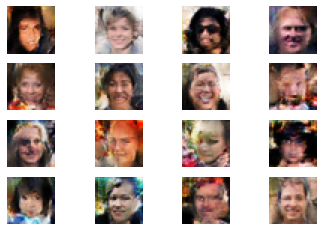

[0.3108270466327667, 0.8765000104904175] 2.0259599685668945
78:0 [D loss: 0.3108270466327667] [G loss: 2.0259599685668945]


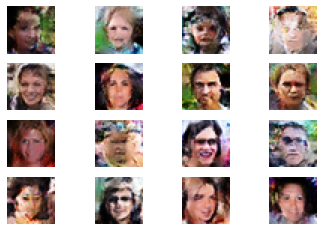

[0.44290968775749207, 0.7879999876022339] 1.6081887483596802
79:0 [D loss: 0.44290968775749207] [G loss: 1.6081887483596802]


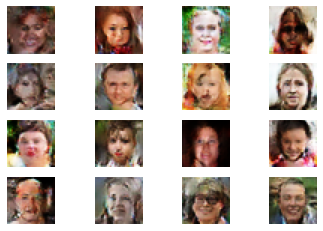

[0.3182920515537262, 0.8744999766349792] 1.7952234745025635
80:0 [D loss: 0.3182920515537262] [G loss: 1.7952234745025635]


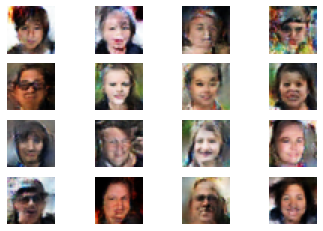

[0.3588113784790039, 0.8485000133514404] 1.5886372327804565
81:0 [D loss: 0.3588113784790039] [G loss: 1.5886372327804565]


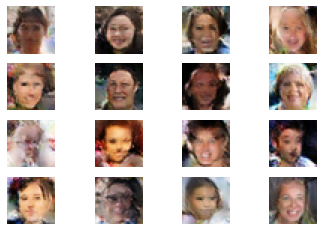

[0.3752572536468506, 0.8420000076293945] 2.0719892978668213
82:0 [D loss: 0.3752572536468506] [G loss: 2.0719892978668213]


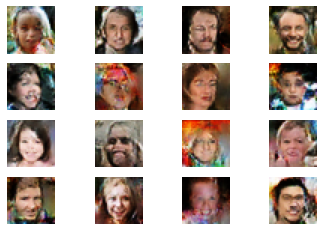

[0.3076936602592468, 0.8640000224113464] 1.4208003282546997
83:0 [D loss: 0.3076936602592468] [G loss: 1.4208003282546997]


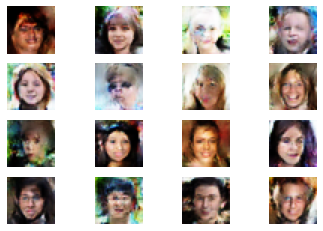

[0.3486035168170929, 0.8445000052452087] 1.760784387588501
84:0 [D loss: 0.3486035168170929] [G loss: 1.760784387588501]


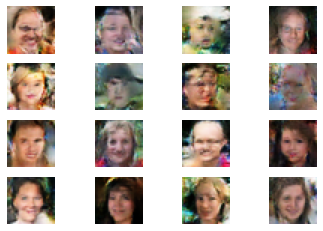

[0.30383339524269104, 0.8769999742507935] 1.4032772779464722
85:0 [D loss: 0.30383339524269104] [G loss: 1.4032772779464722]


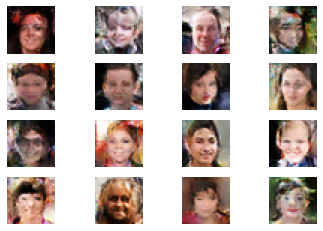

[0.4159884452819824, 0.7940000295639038] 1.3583054542541504
86:0 [D loss: 0.4159884452819824] [G loss: 1.3583054542541504]


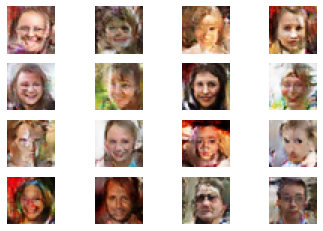

[0.35549336671829224, 0.843999981880188] 1.5389078855514526
87:0 [D loss: 0.35549336671829224] [G loss: 1.5389078855514526]


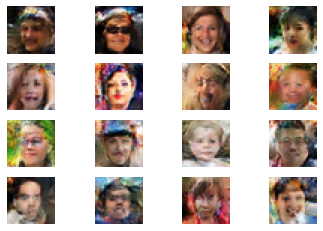

[0.32409054040908813, 0.8709999918937683] 2.058748483657837
88:0 [D loss: 0.32409054040908813] [G loss: 2.058748483657837]


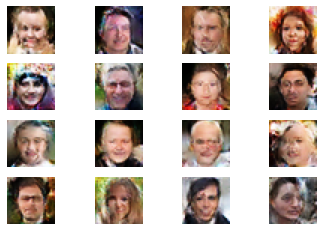

[0.39042627811431885, 0.8174999952316284] 1.7034651041030884
89:0 [D loss: 0.39042627811431885] [G loss: 1.7034651041030884]


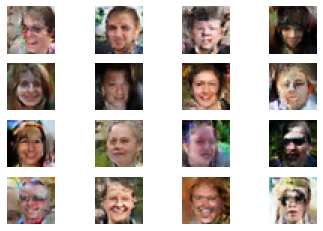

[0.3296840488910675, 0.8485000133514404] 1.6647953987121582
90:0 [D loss: 0.3296840488910675] [G loss: 1.6647953987121582]


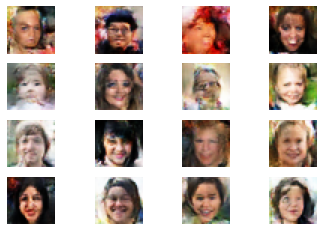

[0.4021660387516022, 0.8059999942779541] 1.1838834285736084
91:0 [D loss: 0.4021660387516022] [G loss: 1.1838834285736084]


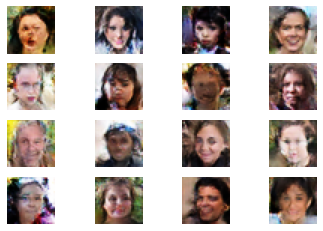

[0.2949889004230499, 0.8895000219345093] 2.4829368591308594
92:0 [D loss: 0.2949889004230499] [G loss: 2.4829368591308594]


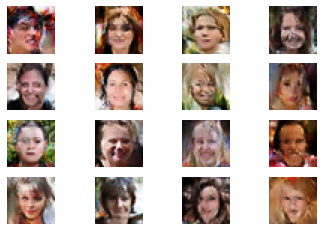

[0.35791826248168945, 0.8460000157356262] 1.2519093751907349
93:0 [D loss: 0.35791826248168945] [G loss: 1.2519093751907349]


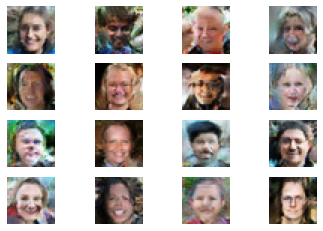

[0.36162397265434265, 0.8339999914169312] 1.2816931009292603
94:0 [D loss: 0.36162397265434265] [G loss: 1.2816931009292603]


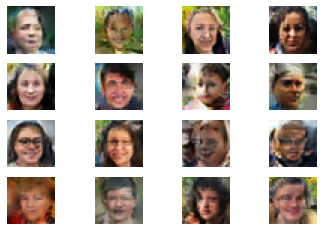

[0.3293941020965576, 0.8675000071525574] 2.1148788928985596
95:0 [D loss: 0.3293941020965576] [G loss: 2.1148788928985596]


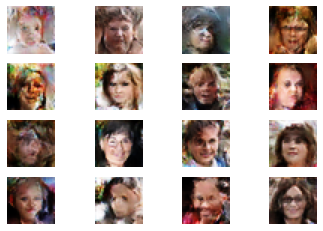

[0.35060393810272217, 0.8374999761581421] 1.2762348651885986
96:0 [D loss: 0.35060393810272217] [G loss: 1.2762348651885986]


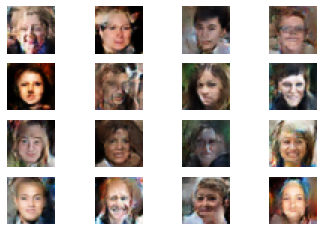

[0.35080328583717346, 0.8360000252723694] 1.3836981058120728
97:0 [D loss: 0.35080328583717346] [G loss: 1.3836981058120728]


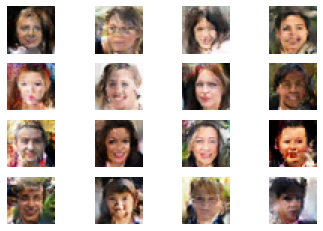

[0.35681360960006714, 0.8454999923706055] 2.2268245220184326
98:0 [D loss: 0.35681360960006714] [G loss: 2.2268245220184326]


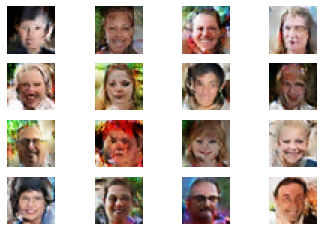

[0.3233381509780884, 0.8650000095367432] 1.6072475910186768
99:0 [D loss: 0.3233381509780884] [G loss: 1.6072475910186768]


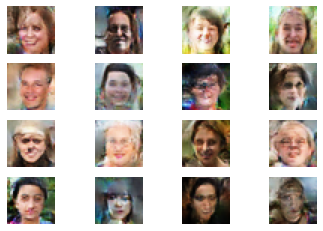

In [10]:
latent_dim = 100
batch_size = 1000
epochs = 100

log_path = 'log/{}/images'.format(dt.datetime.now().strftime("%Y-%m-%d_%H%M%S"))
os.makedirs(log_path, exist_ok=True)

train(train_data)